In [1]:
import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
from torchvision.transforms import Resize, ToTensor, Normalize, Compose
from matplotlib import pyplot as plt

from torchvision.models import resnet50,ResNet50_Weights 

from io import open
import unicodedata
import re



In [2]:
if torch.cuda.is_available():
    device=torch.device(type='cuda', index=0)
else:
    device=torch.device(type='cpu', index=0)

In [3]:
#unicode 2 ascii, remove non-letter characters, trim
def normalizeString(s): 
    sres=""
    for ch in unicodedata.normalize('NFD', s): 
        #Return the normal form form ('NFD') for the Unicode string s.
        if unicodedata.category(ch) != 'Mn':
            # The function in the first part returns the general 
            # category assigned to the character ch as string. 
            # "Mn' refers to Mark, Nonspacing
            sres+=ch
    #sres = re.sub(r"([.!?])", r" \1", sres) 
    # inserts a space before any occurrence of ".", "!", or "?" in the string sres. 
    sres = re.sub(r"[^a-zA-Z!?,]+", r" ", sres) 
    # this line of code replaces any sequence of characters in sres 
    # that are not letters (a-z or A-Z) or the punctuation marks 
    # "!", "," or "?" with a single space character.
    return sres.strip()



In [4]:
#driver code part 1

capt_file_path="flicker8k/captions.txt"
images_dir_path="flicker8k/Images/"

#read data
data=open(capt_file_path).read().strip().split('\n')
data=data[1:]

img_filenames_list=[]
captions_list=[]

for s in data:
    templist=s.lower().split(",")
    img_path=templist[0]
    caption=",".join(s for s in templist[1:])
    caption=normalizeString(caption)
    img_filenames_list.append(img_path)
    captions_list.append(caption)

In [5]:


max_cap_length=73



In [6]:


class Vocab:
    def __init__(self):
        self.word2index={'SOS':0, 'EOS':1}
        self.index2word={0:'SOS', 1:'EOS'}
        self.word2count={}
        self.nwords=2
    
    def buildVocab(self,s):
        for word in s.split(" "):
            if word not in self.word2index:
                self.word2index[word]=self.nwords
                self.index2word[self.nwords]=word
                self.word2count[word]=1
                self.nwords+=1
            else:
                self.word2count[word]+=1



In [7]:
#driver code part 2

#create Vocab objects for each language
vocab=Vocab()

#build the vocab
for caption in captions_list:
    vocab.buildVocab(caption)

#print vocab size
print("Vocab Length:",vocab.nwords)

Vocab Length: 8445


In [8]:
class CustomDataset(Dataset):
    def __init__(self,images_dir_path, img_filenames_list, captions_list, vocab, max_cap_length):
        super().__init__()
        self.images_dir_path=images_dir_path
        self.img_filenames_list=img_filenames_list
        self.captions_list=captions_list
        self.length=len(self.captions_list)
        self.transform=Compose([Resize((224,224), antialias=True), ToTensor(), Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])
        self.vocab=vocab
        self.max_cap_length=max_cap_length
    
    def __len__(self):
        return self.length
    
    def get_input_ids(self, sentence,vocab):
        input_ids=[0]*(self.max_cap_length+1)
        i=0
        for word in sentence.split(" "):
            input_ids[i]=vocab.word2index[word]
            i=i+1

        input_ids.insert(0,vocab.word2index['SOS'])
        i=i+1
        input_ids[i]=vocab.word2index['EOS']
    
        return torch.tensor(input_ids)
    
    def __getitem__(self,idx):
        imgfname,caption=self.img_filenames_list[idx],self.captions_list[idx]
        
        imgfname=self.images_dir_path+imgfname
        img=Image.open(imgfname)
        img=self.transform(img)
        
        caption=self.get_input_ids(caption,self.vocab)       
        
        return img,caption

In [9]:
#driver code part 3
dataset=CustomDataset(images_dir_path, img_filenames_list, captions_list, vocab, max_cap_length)
train_dataset,test_dataset=random_split(dataset,[0.999,0.001])

batch_size=64
train_dataloader=DataLoader(dataset=train_dataset,batch_size=batch_size, shuffle=True)
test_dataloader=DataLoader(dataset=test_dataset,batch_size=1, shuffle=False)

In [10]:
class Encoder(nn.Module):
    def __init__(self, pretrained_feature_extractor):
        super().__init__()
        self.pretrained_feature_extractor=pretrained_feature_extractor
        
    def forward(self,x):
        features=self.pretrained_feature_extractor(x)
        return features

In [11]:


#driver code part 4
pretrained_feature_extractor=resnet50(weights=ResNet50_Weights.DEFAULT)
pretrained_feature_extractor.fc=nn.Linear(2048,1024)

encoder=Encoder(pretrained_feature_extractor).to(device)



In [12]:


class Decoder(nn.Module):
    def __init__(self,output_size,embed_size,hidden_size):
        super().__init__()
        self.e=nn.Embedding(output_size,embed_size)
        self.relu=nn.ReLU()
        self.gru=nn.GRU(embed_size, hidden_size, batch_first=True)
        self.lin=nn.Linear(hidden_size,output_size)
        self.lsoftmax=nn.LogSoftmax(dim=-1)
    
    def forward(self,x,prev_hidden):
        x=self.e(x)
        x=self.relu(x)
        output,hidden=self.gru(x,prev_hidden)
        y=self.lin(output)
        y=self.lsoftmax(y)
        return y, hidden



In [13]:
#driver code part 5
embed_size=300
hidden_size=1024

decoder=Decoder(vocab.nwords,embed_size,hidden_size).to(device)

In [14]:
def train_one_epoch():
    encoder.train()
    decoder.train()
    track_loss=0
    
    for i, (imgs,t_ids) in enumerate(train_dataloader):
        imgs=imgs.to(device)
        t_ids=t_ids.to(device)
        extracted_features=encoder(imgs)
        #extracted_features=extracted_features.detach()
        decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1))
        yhats, decoder_hidden = decoder(t_ids[:,0:-1],decoder_hidden)
                    
        gt=t_ids[:,1:]
        
        yhats_reshaped=yhats.view(-1,yhats.shape[-1])
        
        gt=gt.reshape(-1)
        
        
        loss=loss_fn(yhats_reshaped,gt)
        track_loss+=loss.item()
        
        opte.zero_grad()
        optd.zero_grad()
        
        loss.backward()
        
        opte.step()
        optd.step()
        
        if i%50==0:
            print("Mini Batch=", i+1," Running Loss=",track_loss/(i+1), sep="")
        
    return track_loss/len(train_dataloader)  

In [15]:
def ids2Sentence(ids,vocab):
    sentence=""
    for id in ids.squeeze():
        if id==0:
            continue
        word=vocab.index2word[id.item()]
        sentence+=word + " "
        if id==1:
            break
    return sentence

In [16]:
#eval loop (written assuming batch_size=1)
def eval_one_epoch():
    encoder.eval()
    decoder.eval()
    track_loss=0
    
    with torch.no_grad():
        
        for i, (imgs,t_ids) in enumerate(test_dataloader):
            
            imgs=imgs.to(device)
            t_ids=t_ids.to(device)
            
            extracted_features=encoder(imgs)
            
            decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1)) #n_dim=3
            
            input_ids=t_ids[:,0]
            yhats=[]
            pred_sentence=""
            
            for j in range(1,max_cap_length+2): #j starts from 1
                probs, decoder_hidden = decoder(input_ids.unsqueeze(1),decoder_hidden)
                yhats.append(probs)
                _,input_ids=torch.topk(probs,1,dim=-1)
                input_ids=input_ids.squeeze(1,2) #still a tensor
                word=vocab.index2word[input_ids.item()] #batch_size=1
                pred_sentence+=word + " "
                if input_ids.item() == 1: #batch_size=1
                    break
                                
            
            gt_sentence=ids2Sentence(t_ids,vocab)
            
            print("Input Image:")
            img=imgs[0]
            img[0]=(img[0]*0.229)+0.485
            img[1]=(img[1]*0.224)+0.456
            img[2]=(img[2]*0.225)+0.406
            plt.imshow(torch.permute(imgs[0],(1,2,0)).detach().cpu())
            plt.show()
            
            print("GT Sentence:",gt_sentence)
            
            print("Predicted Sentence:",pred_sentence)
            
            yhats_cat=torch.cat(yhats,dim=1)
            yhats_reshaped=yhats_cat.view(-1,yhats_cat.shape[-1])
            gt=t_ids[:,1:j+1]
            gt=gt.view(-1)
            

            loss=loss_fn(yhats_reshaped,gt)
            track_loss+=loss.item()
            
            
        print("-----------------------------------")
        return track_loss/len(test_dataloader)    

Mini Batch=1 Running Loss=9.057843208312988
Mini Batch=51 Running Loss=5.258738863701914
Mini Batch=101 Running Loss=4.737579442486904
Mini Batch=151 Running Loss=4.4415235124676435
Mini Batch=201 Running Loss=4.2365613885186795
Mini Batch=251 Running Loss=4.0901471675629635
Mini Batch=301 Running Loss=3.9692155657416563
Mini Batch=351 Running Loss=3.8757367161264447
Mini Batch=401 Running Loss=3.795684014175301
Mini Batch=451 Running Loss=3.719599455793258
Mini Batch=501 Running Loss=3.656538338956243
Mini Batch=551 Running Loss=3.602403845414925
Mini Batch=601 Running Loss=3.5544033760635707
Epoch=1 Loss=3.5248
Mini Batch=1 Running Loss=2.598574161529541
Mini Batch=51 Running Loss=2.6852616188572904
Mini Batch=101 Running Loss=2.683964955924761
Mini Batch=151 Running Loss=2.685622092114379
Mini Batch=201 Running Loss=2.688524299593114
Mini Batch=251 Running Loss=2.679044199179843
Mini Batch=301 Running Loss=2.6692990044818763
Mini Batch=351 Running Loss=2.6669838455667523
Mini Batch=

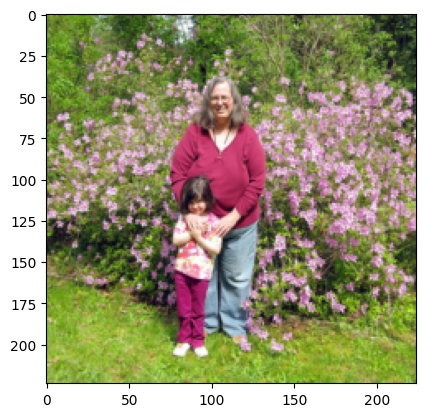

GT Sentence: the woman is standing in the garden with a young girl EOS 
Predicted Sentence: a woman in a pink jacket is standing in front of a flower bush EOS 
Input Image:


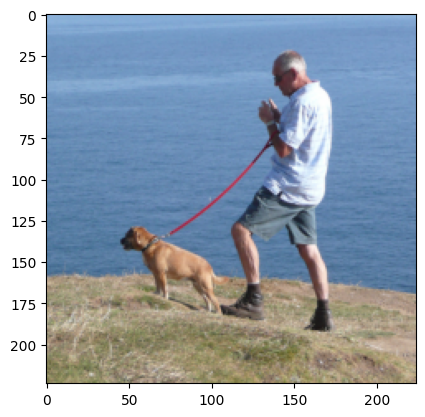

GT Sentence: a man walks his dog near the ocean EOS 
Predicted Sentence: a man and a dog stand on a hill overlooking a lake EOS 
Input Image:


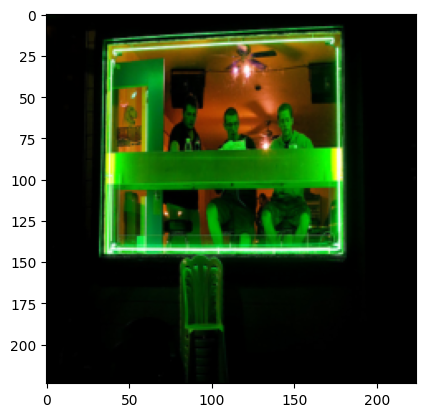

GT Sentence: three men sit down in a building illuminated with green light EOS 
Predicted Sentence: three men sit at a table in a restaurant EOS 
Input Image:


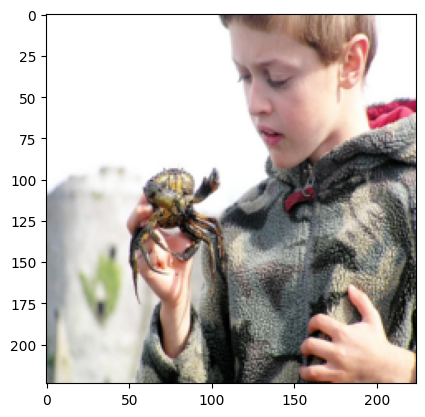

GT Sentence: a boy in a fuzzy goat holds a craw and looks at it EOS 
Predicted Sentence: a boy looks at crab crab EOS 
Input Image:


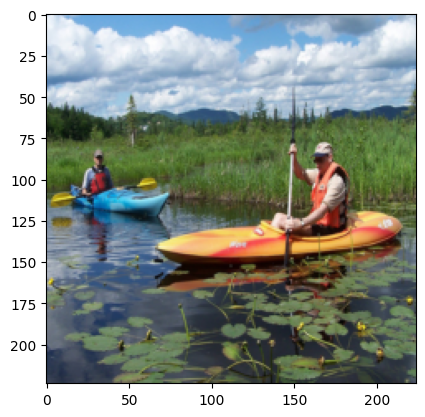

GT Sentence: a blue boat and orange boat float among lilypads in an outdoor setting EOS 
Predicted Sentence: two people rafting down a river EOS 
Input Image:


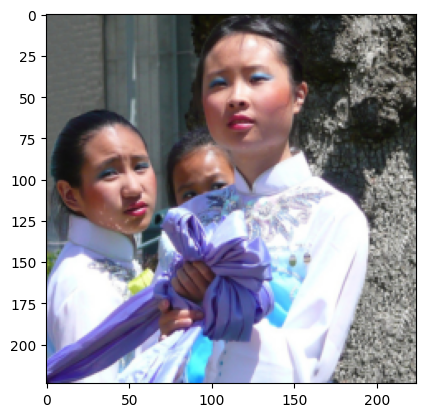

GT Sentence: the girl has a white shirt and a purple item in her hand EOS 
Predicted Sentence: three young adults stand in front of a house EOS 
Input Image:


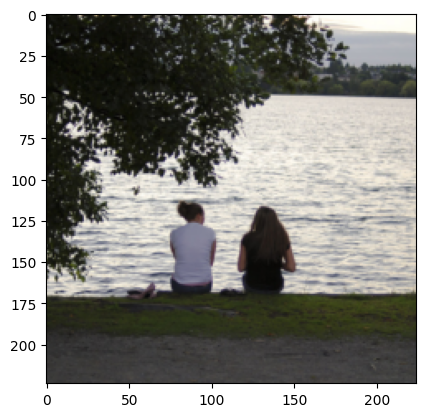

GT Sentence: two girls sitting beside the water near a tree EOS 
Predicted Sentence: two girls are sitting in a lake EOS 
Input Image:


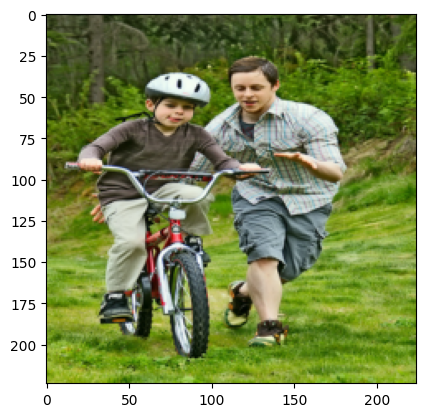

GT Sentence: a boy teaches a smaller boy wearing a helmet how to ride a bike EOS 
Predicted Sentence: a man helps a young boy ride a bike EOS 
Input Image:


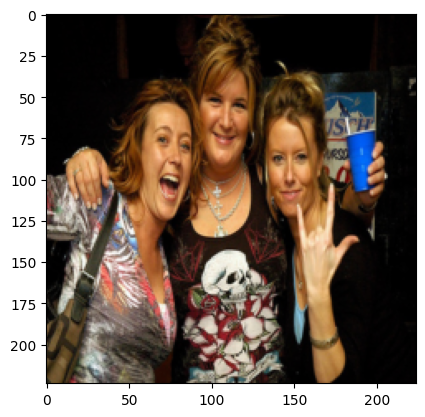

GT Sentence: three women are drinking and hugging EOS 
Predicted Sentence: three women are posing for a photograph in front of a christmas tree EOS 
Input Image:


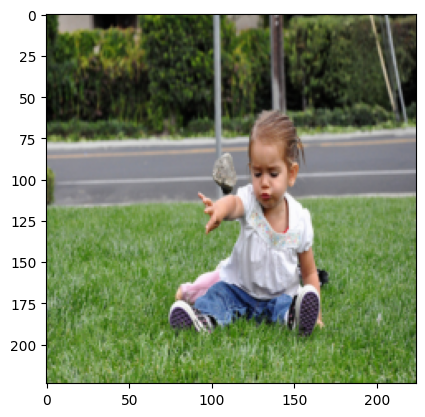

GT Sentence: a baby girl in a white shirt and jeans sits on the grass by the street EOS 
Predicted Sentence: a young girl is sitting on the grass EOS 
Input Image:


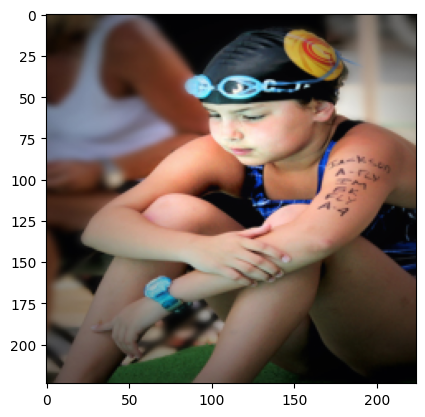

GT Sentence: a young swimmer sits in a bathing suit and waits for the next race EOS 
Predicted Sentence: a young girl in a competitive outfit EOS 
Input Image:


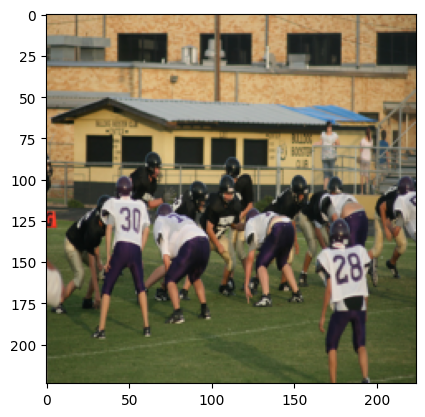

GT Sentence: two teams of football players about to start a game EOS 
Predicted Sentence: two football teams play a game EOS 
Input Image:


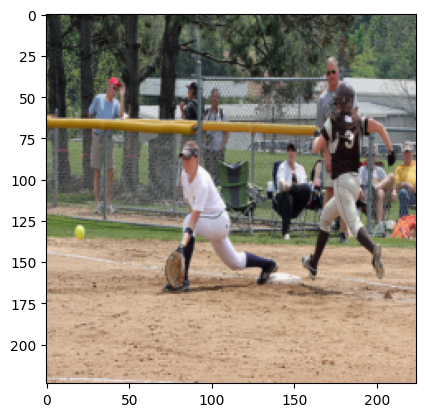

GT Sentence: an umpire in a baseball game crouches to catch a ball while an opposing team member runs to homebase EOS 
Predicted Sentence: two girls playing softball EOS 
Input Image:


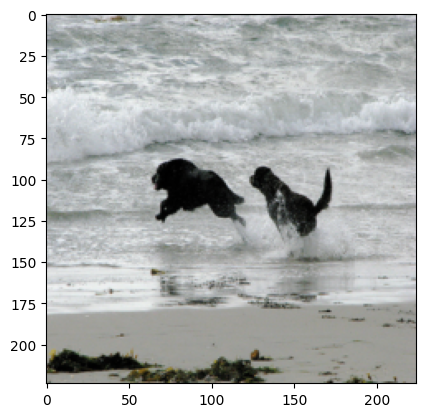

GT Sentence: two dogs are running around in the water EOS 
Predicted Sentence: two black dogs run into the surf EOS 
Input Image:


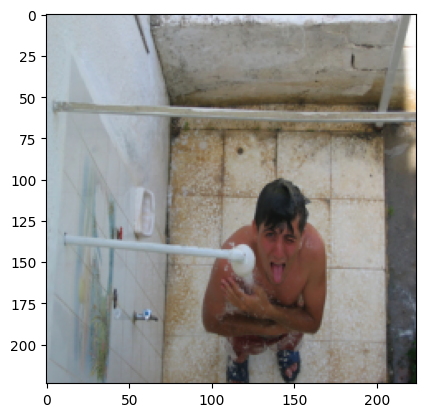

GT Sentence: a man takes a shower outdoors and looks up to stick out his tongue EOS 
Predicted Sentence: a man is standing next to a concrete wall EOS 
Input Image:


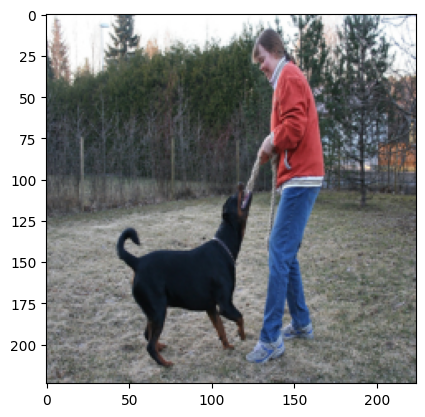

GT Sentence: a woman plays with her rottweiler dog outside EOS 
Predicted Sentence: a woman in a red coat and a black dog is playing tug of war EOS 
Input Image:


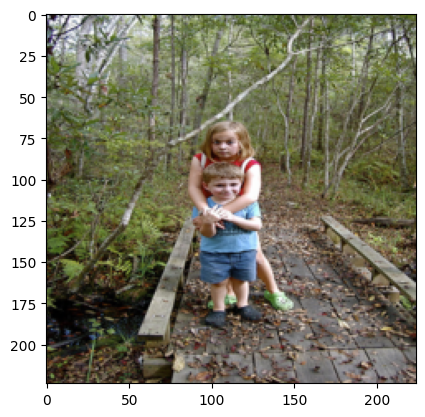

GT Sentence: a girl and a boy hugging on a bridge EOS 
Predicted Sentence: a little girl hugs a little boy in a forest EOS 
Input Image:


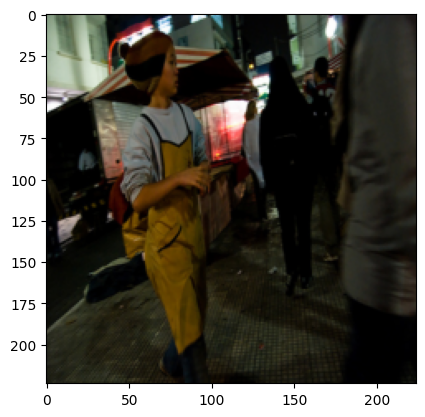

GT Sentence: a woman wearing a yellow apron and a knit hat walks among other pedestrians EOS 
Predicted Sentence: a person in a yellow jacket is walking past a wooden building EOS 
Input Image:


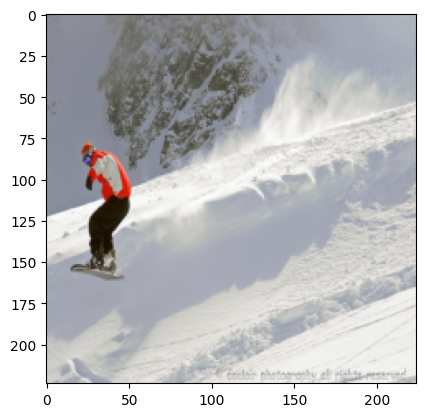

GT Sentence: man on a snowboard sliding in the air down a snow covered hill EOS 
Predicted Sentence: a man in a red suit is skiing down a snowy mountain EOS 
Input Image:


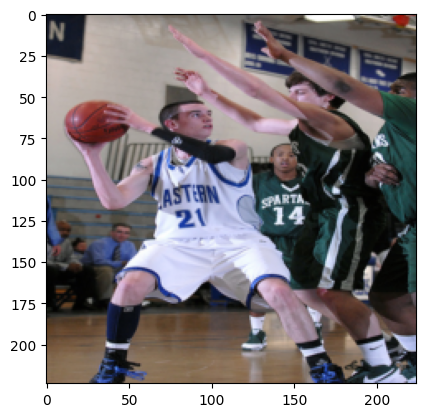

GT Sentence: a young man in a white uniform holds a basketball surrounded by members of the opposing team wearing green EOS 
Predicted Sentence: a basketball player in a duke uniform is trying to block the ball EOS 
Input Image:


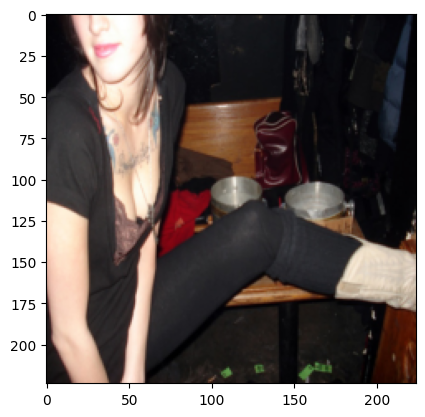

GT Sentence: a woman dressed in black EOS 
Predicted Sentence: a woman in black is posing for a photograph EOS 
Input Image:


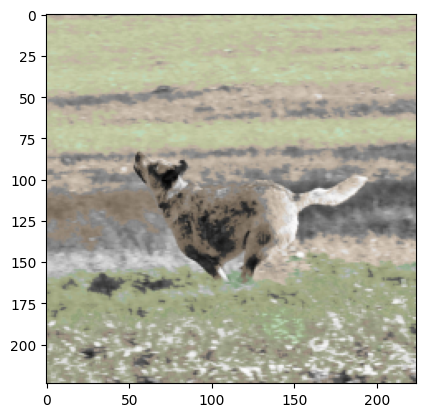

GT Sentence: a dog is running through a field EOS 
Predicted Sentence: a black and white dog is running through a field EOS 
Input Image:


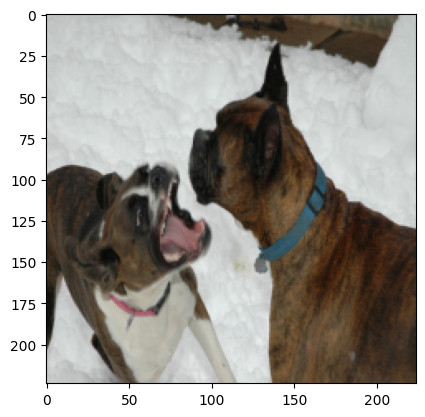

GT Sentence: a brown and white dog with a pink collar is barking at a brown dog with a blue collar in the snow EOS 
Predicted Sentence: a dog with a sleeve in its mouth is standing next to a man in a blue coat EOS 
Input Image:


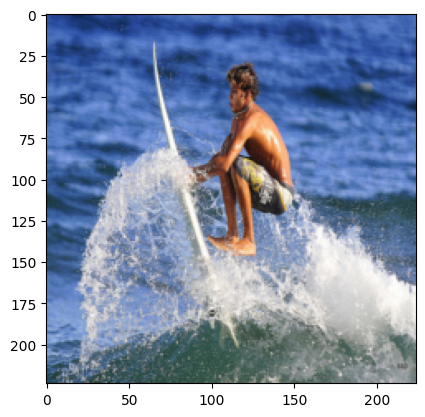

GT Sentence: a boy surfs EOS 
Predicted Sentence: barechested barechested barechested water EOS 
Input Image:


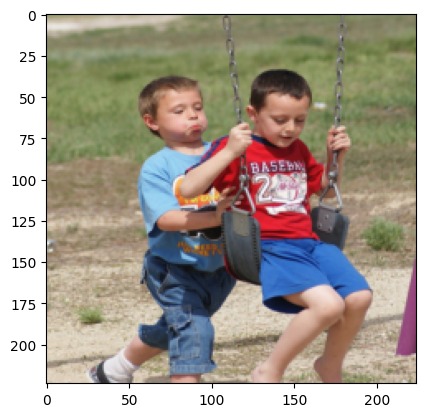

GT Sentence: a boy pushing another boy on the swing EOS 
Predicted Sentence: two boys swing on a swing EOS 
Input Image:


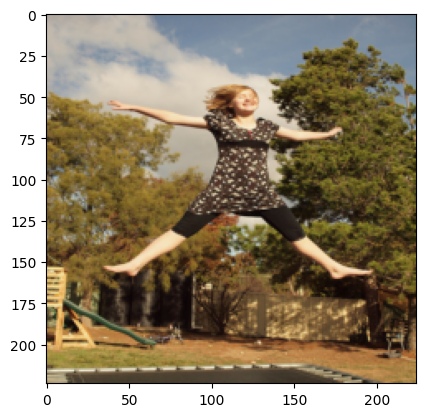

GT Sentence: a girl doing the splits in the air while jumping on a trampoline EOS 
Predicted Sentence: a young girl in a black shirt and brown pants frolics in the air EOS 
Input Image:


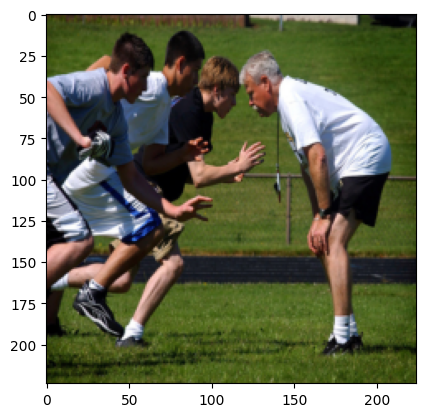

GT Sentence: three teenage boys are running towards an older man in a white shirt EOS 
Predicted Sentence: a group of men play croquet EOS 
Input Image:


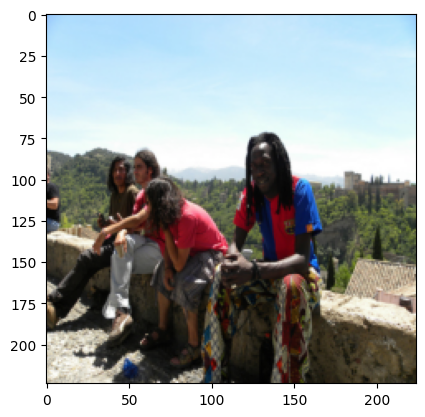

GT Sentence: four adults are sitting on a ledge overlooking mountains EOS 
Predicted Sentence: a group of people sit on a cement ledge EOS 
Input Image:


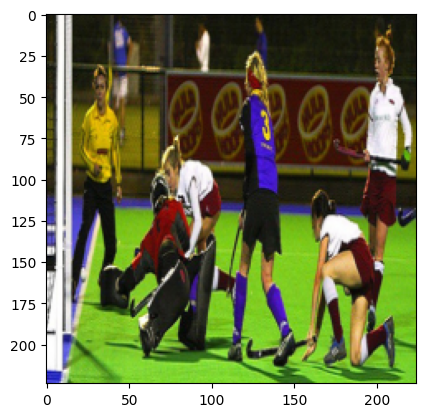

GT Sentence: girls play field hockey EOS 
Predicted Sentence: a goalie is trying to catch the ball EOS 
Input Image:


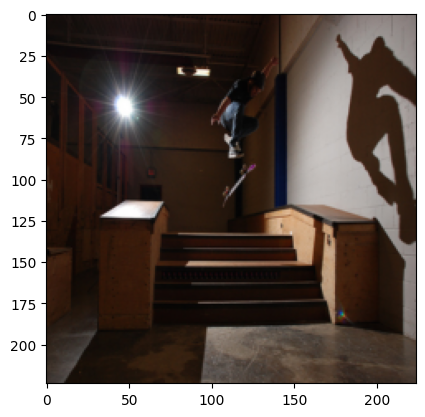

GT Sentence: a skateboarder jumps a staircase EOS 
Predicted Sentence: a skateboarder flies over a brick rail EOS 
Input Image:


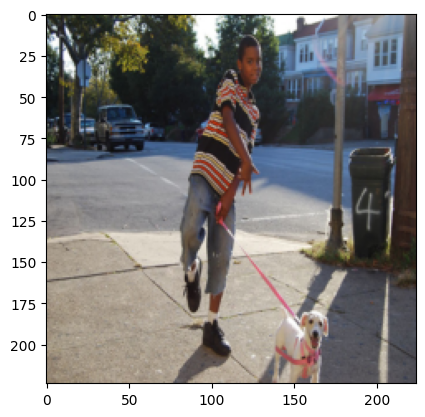

GT Sentence: a young boy showing off while walking his white dog in a neighborhood EOS 
Predicted Sentence: a boy signals with a red shirt and a white and black striped shirt on his head EOS 
Input Image:


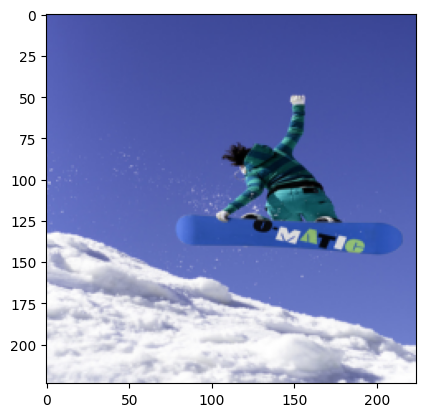

GT Sentence: a snowboarder in midair over a snow hill EOS 
Predicted Sentence: a man is snowboarding down a snowy hill EOS 
Input Image:


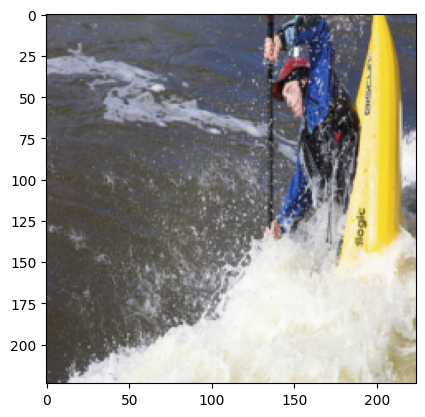

GT Sentence: man in a yellow kayak is paddling through the rapids EOS 
Predicted Sentence: a man in a yellow kayak is floating through rough waters EOS 
Input Image:


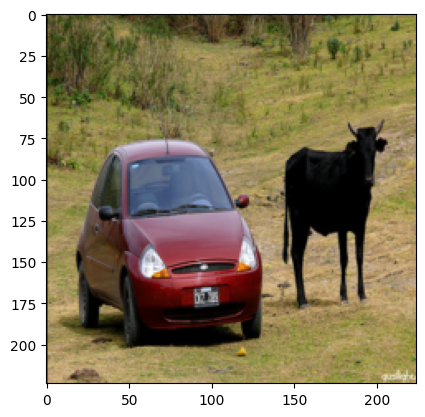

GT Sentence: there is a small red car with a black bull standing beside it in the middle of a field EOS 
Predicted Sentence: a red car parked next to a red bull EOS 
Input Image:


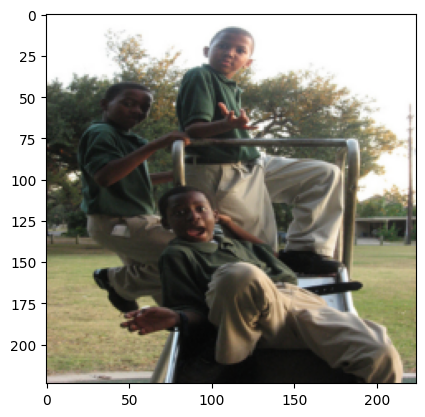

GT Sentence: three boys wearing green shirts and tan pants pose at the top of a slide EOS 
Predicted Sentence: three boys are climbing on a playground equipment EOS 
Input Image:


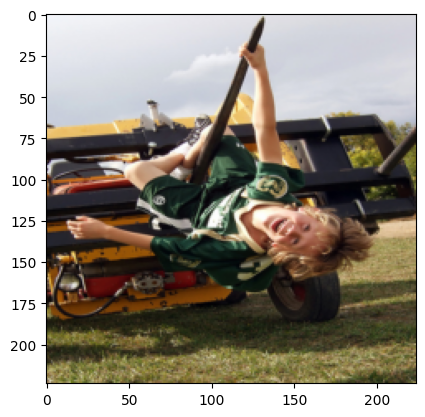

GT Sentence: a boy in a green soccer outfit hangs from a machine EOS 
Predicted Sentence: a child hangs upside down from a swing EOS 
Input Image:


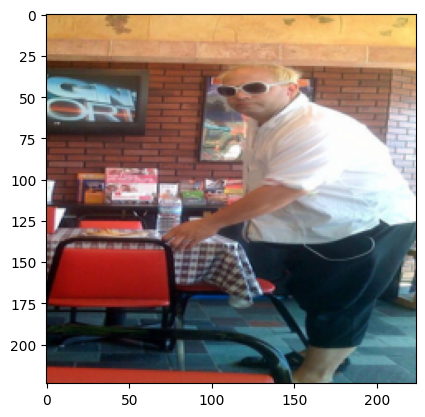

GT Sentence: man at eatery getting ready to sit down EOS 
Predicted Sentence: a man in a butchers outfit sitting at a table in a mall EOS 
Input Image:


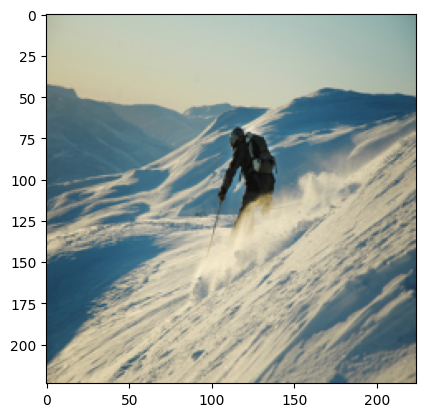

GT Sentence: a person skis down a snowy hill EOS 
Predicted Sentence: a skier swishing down a mountain with gear in the background EOS 
Input Image:


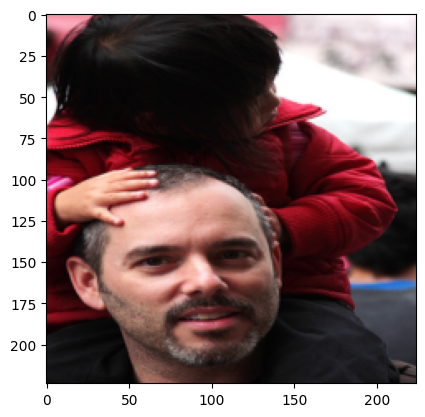

GT Sentence: a small child in a red jacket is sitting on a man s shoulders and holding his head EOS 
Predicted Sentence: a man in a red shirt is holding a child in his arms EOS 
Input Image:


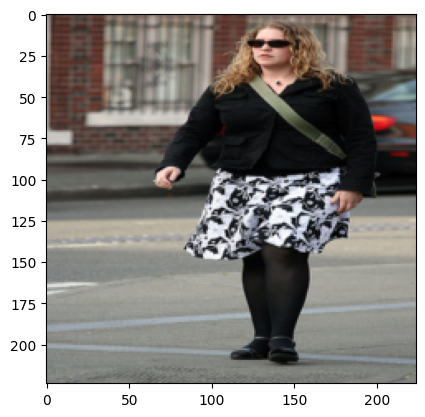

GT Sentence: a woman with a bag around her standing in the street EOS 
Predicted Sentence: a woman in a black and white striped shirt and black pants walks down the street EOS 
-----------------------------------
Epoch=1 Loss=7.4329


In [17]:
#driver code part 5

loss_fn=nn.NLLLoss(ignore_index=0).to(device)
lr=0.001

optd=optim.Adam(params=decoder.parameters(), lr=lr)
opte=optim.Adam(params=encoder.parameters(), lr=lr)

n_epochs=5

for e in range(n_epochs):
    print("Epoch=",e+1, " Loss=", round(train_one_epoch(),4), sep="")

for e in range(1):
    print("Epoch=",e+1, " Loss=", round(eval_one_epoch(),4), sep="")